# Vintage Art Via K-means

#### **Importing Libraries**

In [2]:
%matplotlib inline
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from IPython.display import Image
from imageio import imread
from skimage.transform import resize
from matplotlib.colors import to_hex

## Prepare image data

As the first step, we read the image file from the local directory. For a color image, the function `imread` returns a three-dimensional array, where each column corresponds to a color - the order is BGR (blue, green, red). We need to convert this into a dataframe so that we can use k-means on it.

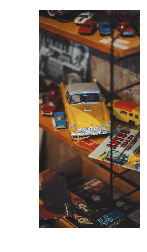

In [246]:
# Load the image
fpath = 'images/IMG_4807.JPG'
img = imread(fpath)
plt.axis('off')
plt.imshow(img)

In [247]:
# Convert the image to a dataframe, with each row represent the color of a pixel
img_resized = resize(img,(300,300))
img_np = img_resized.reshape(-1,3)
img_data = pd.DataFrame(img_np, columns=['b','g','r'])

## Color reduction

In the context of image data, the role of K-means clustering is essentially color reduction. When using K-means clustering, each of the resulting cluster centroids represents a cluster of pixels. That's to say, the number of colors of the final picture is equal to the number of clusters (k) defined when applying K-means, and the centroids decide what the exact colors are in the color palette. Once we have the centroids, we can recreate the image by replacing the color of each pixel with the color of its cluster centroid. By setting the k to 4, we will have the original photo transformed into one with only four colors.

In [248]:
# Apply kmeans clustering on the image data
kmeans = KMeans(n_clusters=4, random_state=1)
labels = kmeans.fit_predict(img_data)
img_data['labels'] = labels

In [249]:
# Make all the pixels in the same cluster the same color as the centroid
colors = kmeans.cluster_centers_
color_lst = []
for c in colors:
    color_lst.append([[tuple(c)]])
    
img_data['b'] = img_data['labels'].apply(lambda x: color_lst[x][0][0][0])
img_data['g'] = img_data['labels'].apply(lambda x: color_lst[x][0][0][1])
img_data['r'] = img_data['labels'].apply(lambda x: color_lst[x][0][0][2])

In [250]:
# Transform the result back to the original image
new_img = img_data[['b','g','r']].values
new_img = new_img.reshape(300,300,3)
h = img.shape[0]
w = img.shape[1]
new_img = resize(new_img,(h,w))

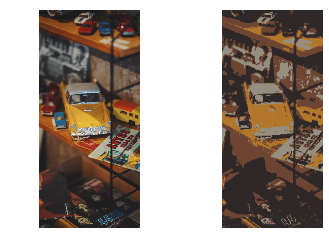

In [251]:
# Display the image
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(img)
plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(new_img)

## Batch Image Processing 

To apply this transformation to all the image files in my local directory, I wrapped the above steps into a function and batch processing the images using a loop. In the end, I created a gallery-like plot to display the results and saved it as a new image file.

In [215]:
# Wrap the procedures in a function:
def transform_image(fpath, img_lst):
    img = imread(fpath)
    
    # Convert the image to a dataframe, with each row represent the color of a pixel
    img_resized = resize(img,(300,300))
    img_np = img_resized.reshape(-1,3)
    img_data = pd.DataFrame(img_np, columns=['r','g','b'])
    
    # Apply kmeans clustering on the image data
    kmeans = KMeans(n_clusters=4, random_state=1)
    labels = kmeans.fit_predict(img_data)
    img_data['labels'] = labels
    
    # Make all the pixels in the same cluster the same color as the centroid
    colors = kmeans.cluster_centers_
    color_lst = []
    for c in colors:
        color_lst.append([[tuple(c)]])

    img_data['b'] = img_data['labels'].apply(lambda x: color_lst[x][0][0][0])
    img_data['g'] = img_data['labels'].apply(lambda x: color_lst[x][0][0][1])
    img_data['r'] = img_data['labels'].apply(lambda x: color_lst[x][0][0][2])
    
    # Transform the result back to the original image
    new_img = img_data[['b','g','r']].values
    new_img = new_img.reshape(300,300,3)
    h = img.shape[0]
    w = img.shape[1]
    new_img = resize(new_img,(h,w))
    
    # Display the image
    img_lst.append(img)
    img_lst.append(new_img)


In [239]:
# Batch transforming the images
directory = 'images'
img_lst = []
for fname in os.listdir(directory):
    if fname.startswith('IMG'):
        fpath = directory+'/'+fname
        transform_image(fpath, img_lst)     

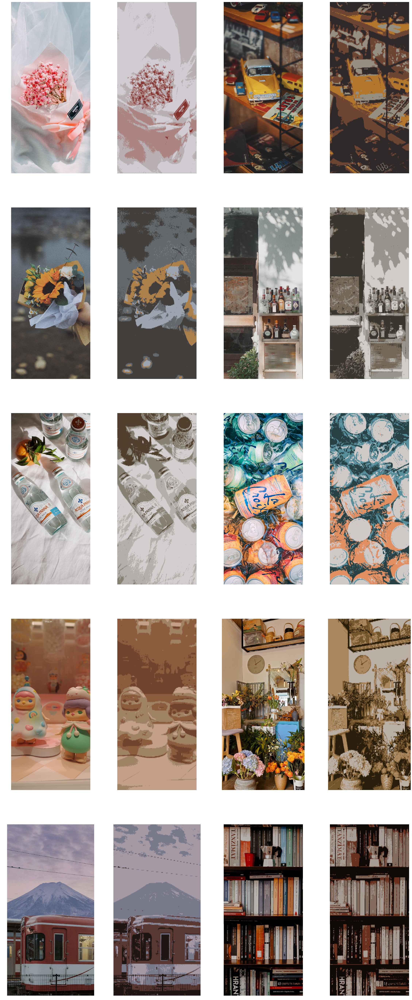

In [252]:
# Specifying the grid size
fig = plt.figure(figsize=(40,100)) # specifying the overall grid size

# Display the results nicely
for i in range(20):
    plt.subplot(5,4,i+1) #5*4=20 images
    plt.axis('off')
    plt.imshow(img_lst[i])

plt.show()

In [253]:
# Save a plot resulting from the above matplotlib function 
fig.savefig("gallery.png")